In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("./output_csv/balanced_normalized_features_added_keypoints_activity_v11s.csv")

In [3]:
print(data.columns.tolist())

['kp0_x', 'kp0_y', 'kp1_x', 'kp1_y', 'kp2_x', 'kp2_y', 'kp3_x', 'kp3_y', 'kp4_x', 'kp4_y', 'kp5_x', 'kp5_y', 'kp6_x', 'kp6_y', 'kp7_x', 'kp7_y', 'kp8_x', 'kp8_y', 'kp9_x', 'kp9_y', 'kp10_x', 'kp10_y', 'kp11_x', 'kp11_y', 'kp12_x', 'kp12_y', 'kp13_x', 'kp13_y', 'kp14_x', 'kp14_y', 'kp15_x', 'kp15_y', 'kp16_x', 'kp16_y', 'kp17_x', 'kp17_y', 'kp18_x', 'kp18_y', 'kp19_x', 'kp19_y', 'kp20_x', 'kp20_y', 'kp21_x', 'kp21_y', 'kp22_x', 'kp22_y', 'left_elbow_angle', 'right_elbow_angle', 'left_knee_angle', 'right_knee_angle', 'spine_curvature_angle', 'neck_angle', 'tail_angle', 'body_length', 'tail_length', 'nose_to_left_wrist_dist', 'nose_to_right_wrist_dist', 'wrist_distance', 'nose_to_left_ankle_dist', 'nose_to_right_ankle_dist', 'hind_paw_distance', 'nose_to_left_wrist_ratio', 'nose_to_right_wrist_ratio', 'hind_paw_distance_ratio', 'label']


In [4]:
data.head()

,kp0_x,kp0_y,kp1_x,kp1_y,kp2_x,kp2_y,kp3_x,kp3_y,kp4_x,kp4_y,...,nose_to_left_wrist_dist,nose_to_right_wrist_dist,wrist_distance,nose_to_left_ankle_dist,nose_to_right_ankle_dist,hind_paw_distance,nose_to_left_wrist_ratio,nose_to_right_wrist_ratio,hind_paw_distance_ratio,label
0,0.670469,0.910619,0.657512,0.907142,0.700005,0.895004,0.631435,0.917973,0.637337,0.921836,...,0.592872,0.615861,0.806872,0.666080,0.636805,0.719442,0.258673,0.307457,0.256543,grooming
1,0.417693,0.581483,0.423475,0.550110,0.467802,0.567949,0.379182,0.553628,0.423794,0.529115,...,0.377902,0.365178,0.521932,0.386997,0.502815,0.507561,0.202374,0.224222,0.257665,grooming
2,0.595579,0.721361,0.588810,0.773545,0.580085,0.740995,0.599975,0.760792,0.581856,0.828779,...,0.339601,0.330391,0.503476,0.528808,0.498678,0.667182,0.176821,0.182008,0.321301,grooming
3,0.223956,0.333957,0.171061,0.310154,0.210293,0.283609,0.179927,0.353566,0.121401,0.307122,...,0.421493,0.357186,0.415457,0.387600,0.510647,0.525781,0.260581,0.291962,0.334866,grooming
4,0.199698,0.351683,0.153840,0.324106,0.195810,0.293763,0.157965,0.363855,0.106052,0.315930,...,0.352116,0.258096,0.431872,0.363077,0.471359,0.718597,0.221378,0.201867,0.450381,grooming


In [5]:
print(data['label'].value_counts())

label
grooming      756
scratching    756
standing      756
Name: count, dtype: int64


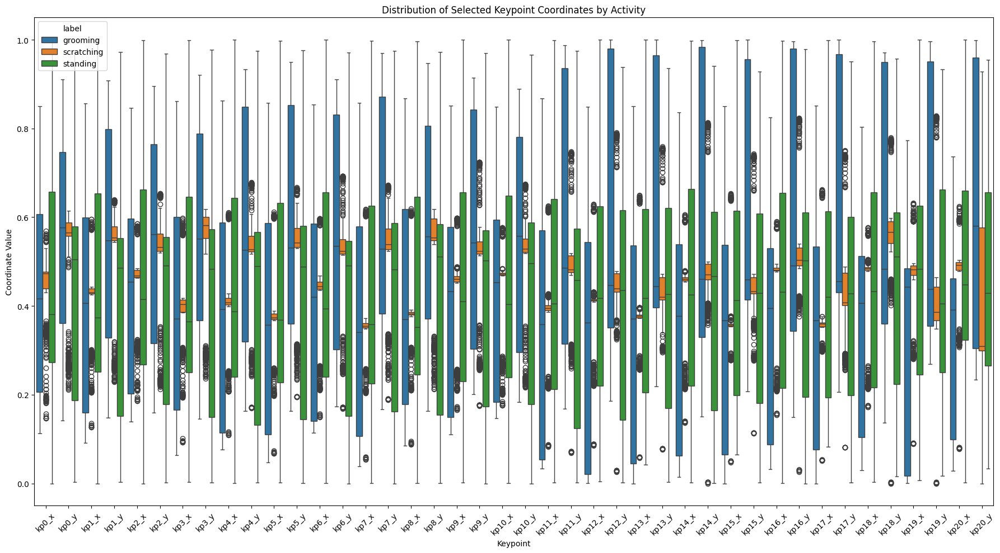

In [6]:
# Create a boxplot to visualize feature distribution by class
df_long = data.melt(id_vars=['label'], var_name='keypoint', value_name='value')

# Separate x and y coordinates
df_long['coord_type'] = df_long['keypoint'].apply(lambda x: 'x' if '_x' in x else 'y')
df_long['keypoint_id'] = df_long['keypoint'].apply(lambda x: x.split('_')[0])

# Visualize a few keypoints to avoid a cluttered plot
selected_keypoints = ['kp0','kp1','kp2','kp3','kp4','kp5','kp6','kp7','kp8','kp9','kp10','kp11', 'kp12','kp13','kp14','kp15','kp16','kp17','kp18','kp19', 'kp20', 'kp21' 'kp22']
df_filtered = df_long[df_long['keypoint_id'].isin(selected_keypoints)]

# Create a boxplot for x and y coordinates of selected keypoints
plt.figure(figsize=(18, 10))
sns.boxplot(data=df_filtered, x='keypoint', y='value', hue='label')
plt.title('Distribution of Selected Keypoint Coordinates by Activity')
plt.xlabel('Keypoint')
plt.ylabel('Coordinate Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('./csv_plots/balanced_normalized_features_added_keypoints_activity/distributions_keypoints_balanced_normalized_features_added_keypoints_activity.png')
plt.show()

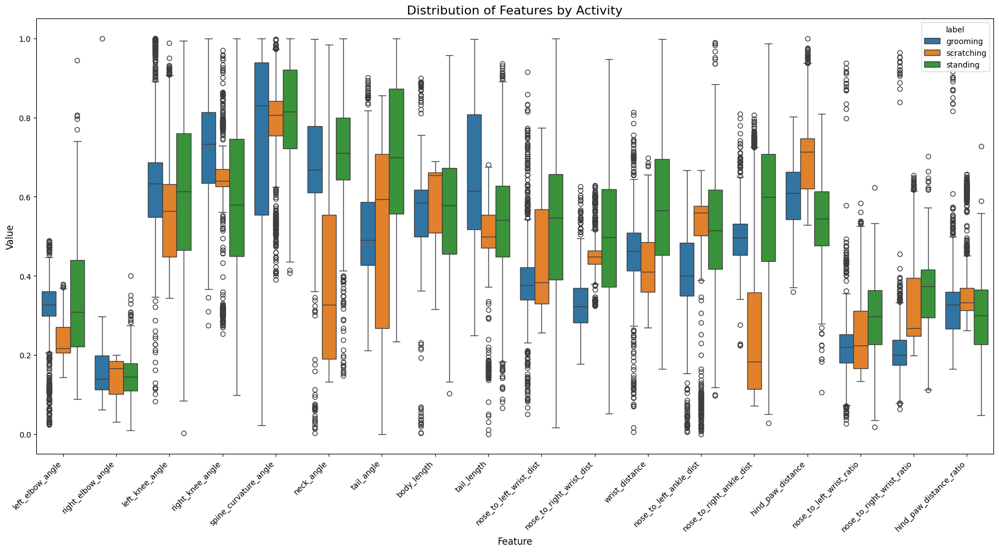

In [7]:
# List of the 18 features you want to plot
selected_features = [
    'left_elbow_angle', 'right_elbow_angle', 'left_knee_angle', 'right_knee_angle',
    'spine_curvature_angle', 'neck_angle', 'tail_angle', 'body_length', 'tail_length',
    'nose_to_left_wrist_dist', 'nose_to_right_wrist_dist', 'wrist_distance',
    'nose_to_left_ankle_dist', 'nose_to_right_ankle_dist', 'hind_paw_distance',
    'nose_to_left_wrist_ratio', 'nose_to_right_wrist_ratio', 'hind_paw_distance_ratio'
]

# Create a new DataFrame that contains only the features you want to plot and the 'label'
features_to_plot = data[selected_features + ['label']]

# Reshape the data into a "long" format, which is ideal for Seaborn
df_long = features_to_plot.melt(id_vars=['label'], var_name='feature', value_name='value')

# Create the Boxplot
plt.figure(figsize=(18, 10))
sns.boxplot(data=df_long, x='feature', y='value', hue='label')

# Customize the plot for better readability
plt.title('Distribution of Features by Activity', fontsize=16)
plt.xlabel('Feature', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.xticks(rotation=45, ha='right')  
plt.tight_layout()  
plt.savefig('./csv_plots/balanced_normalized_features_added_keypoints_activity/distributions_features_balanced_normalized_features_added_keypoints_activity.png')
plt.show()

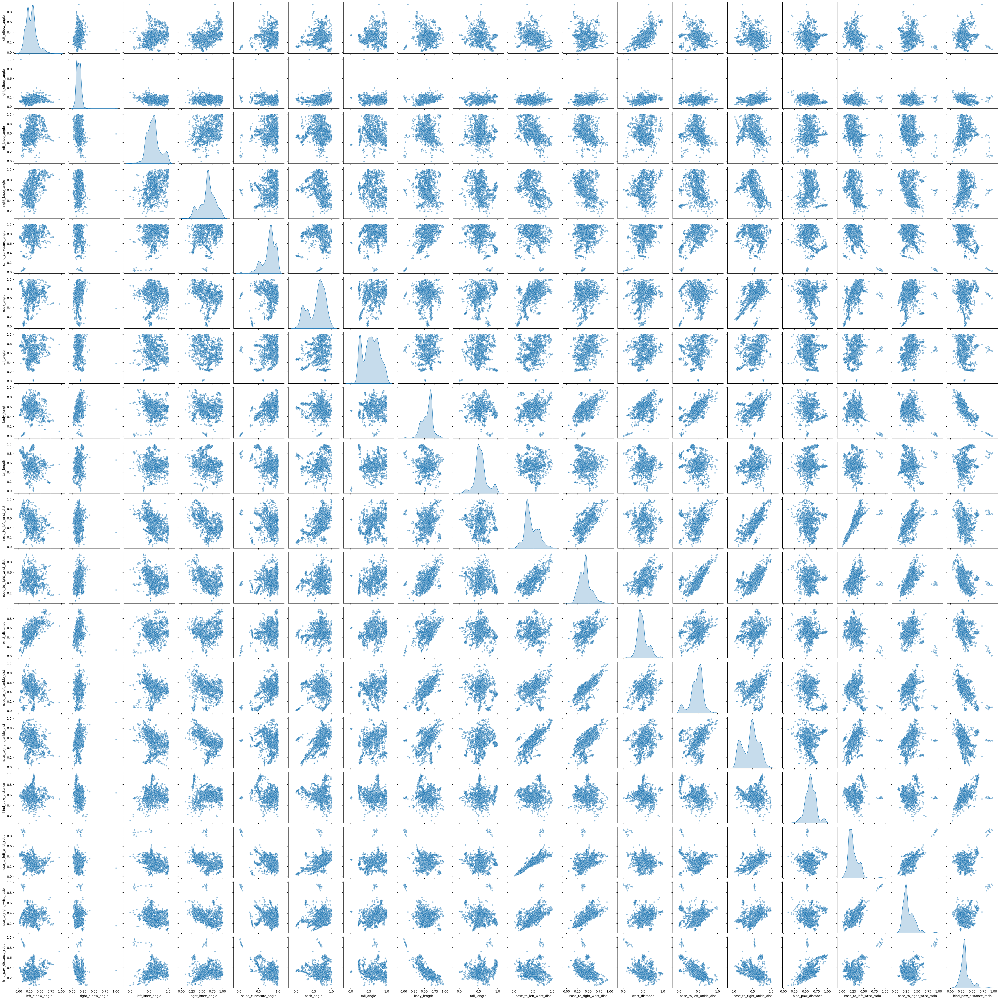

In [8]:
g = sns.pairplot(data[selected_features], diag_kind="kde", plot_kws={"alpha":0.5, "s":20})
g.savefig('./csv_plots/balanced_normalized_features_added_keypoints_activity/pair_plot_features_balanced_normalized_features_added_keypoints_activity.png')
plt.show()

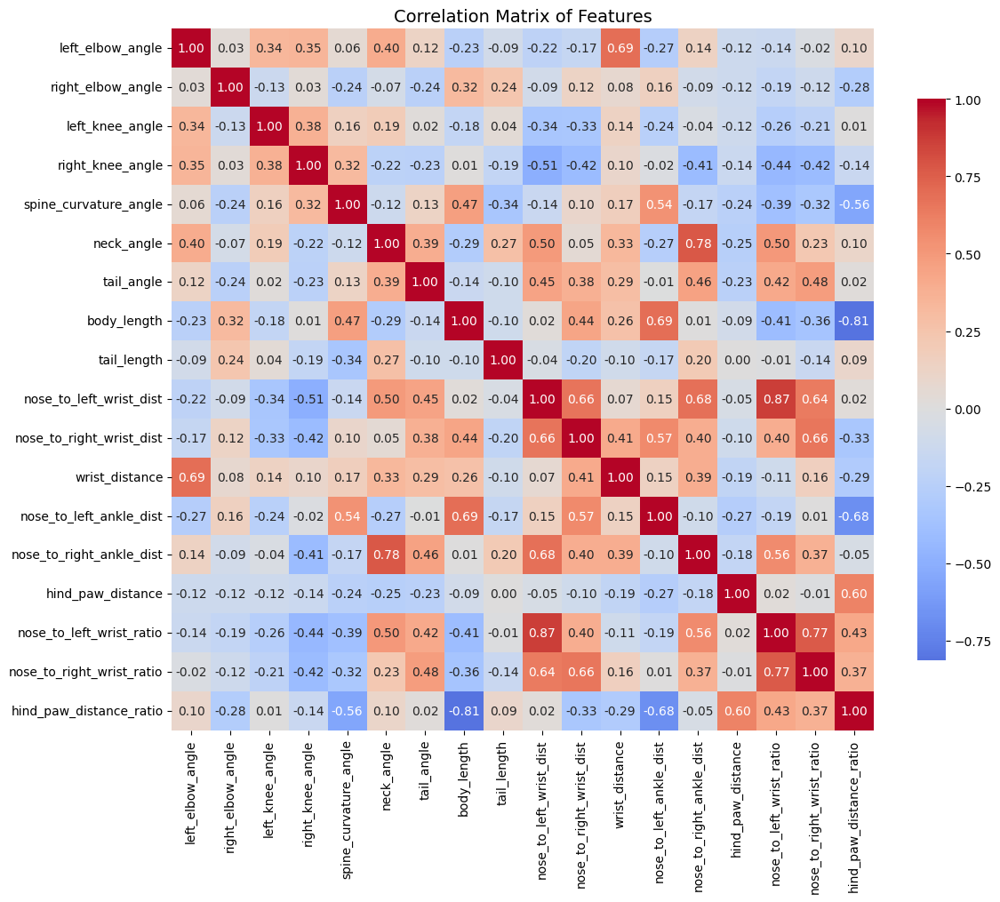

In [9]:
# Compute correlation matrix
features = data[selected_features]
corr = features.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr,
    annot=True,         # show correlation values
    fmt=".2f",          # format to 2 decimals
    cmap="coolwarm",    # color scheme
    center=0,
    square=True,
    cbar_kws={"shrink": 0.8}
)
plt.title("Correlation Matrix of Features", fontsize=14)
plt.savefig("./csv_plots/balanced_normalized_features_added_keypoints_activity/correlation_matrix_balanced_normalized_features_added_keypoints_activity.png", dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()

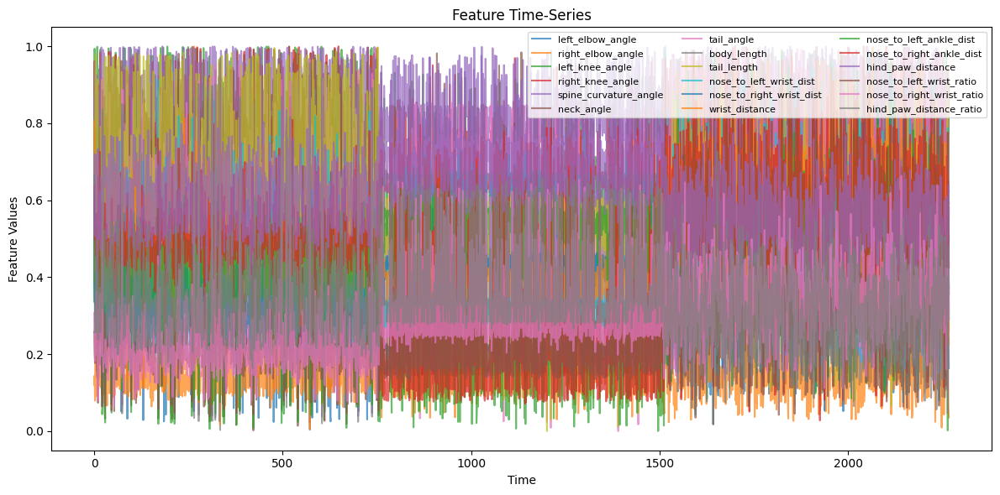

In [10]:
# Assume df has a 'time' column, if not use index
time = range(len(data))

plt.figure(figsize=(12, 6))
for col in features:   
    plt.plot(time, data[col], label=col, alpha=0.7)

plt.xlabel("Time")
plt.ylabel("Feature Values")
plt.title("Feature Time-Series")
plt.legend(loc="upper right", ncol=3, fontsize=8)
plt.tight_layout()
plt.savefig("./csv_plots/balanced_normalized_features_added_keypoints_activity/feature_timeseries_balanced_normalized_features_added_keypoints_activity.png")
plt.show()

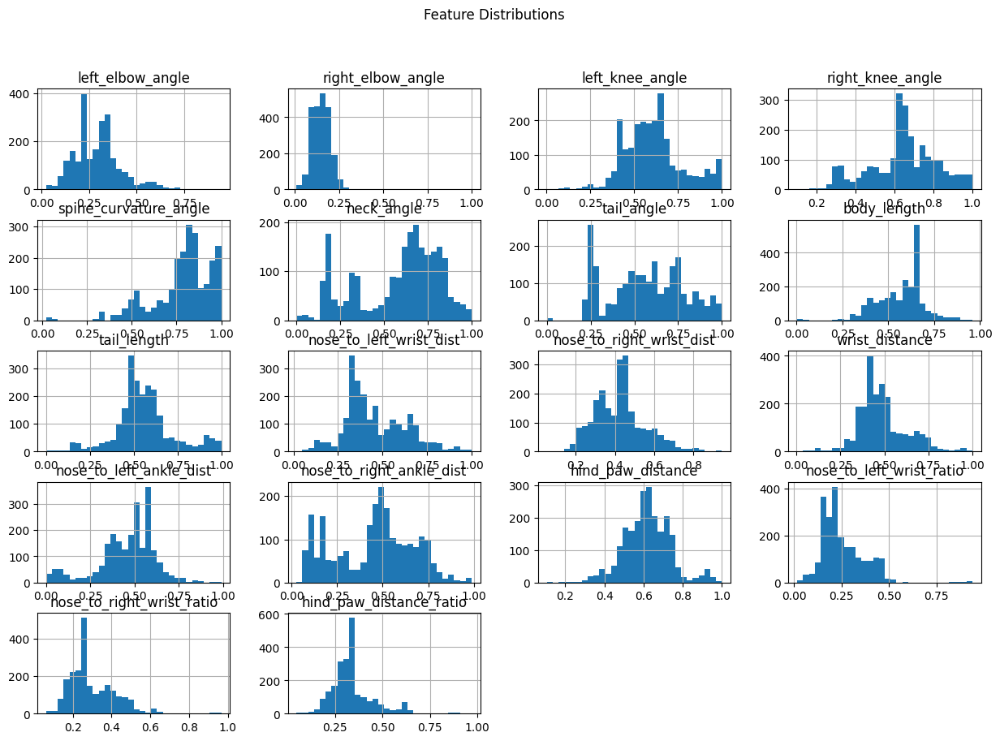

In [11]:
features.hist(bins=30, figsize=(15, 10))
plt.suptitle("Feature Distributions")
plt.xlabel("value")
plt.ylabel("counts")
plt.savefig("./csv_plots/balanced_normalized_features_added_keypoints_activity/feature_distributions_balanced_normalized_features_added_keypoints_activity.png")
plt.show()

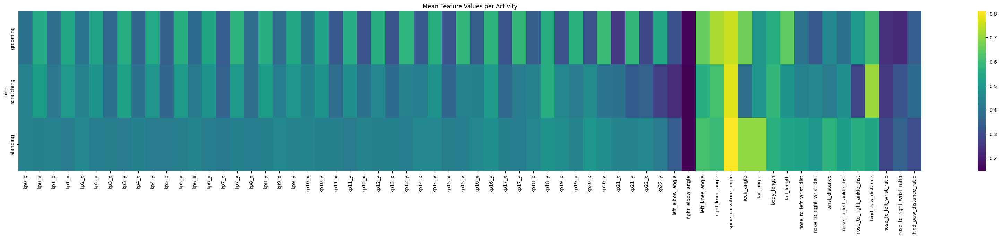

In [12]:
mean_features = data.groupby("label").mean()
plt.figure(figsize=(42, 6))
sns.heatmap(mean_features, annot=False, cmap="viridis")
plt.title("Mean Feature Values per Activity")
plt.savefig("./csv_plots/balanced_normalized_features_added_keypoints_activity/feature_mean_balanced_normalized_features_added_keypoints_activity.png")
plt.show()

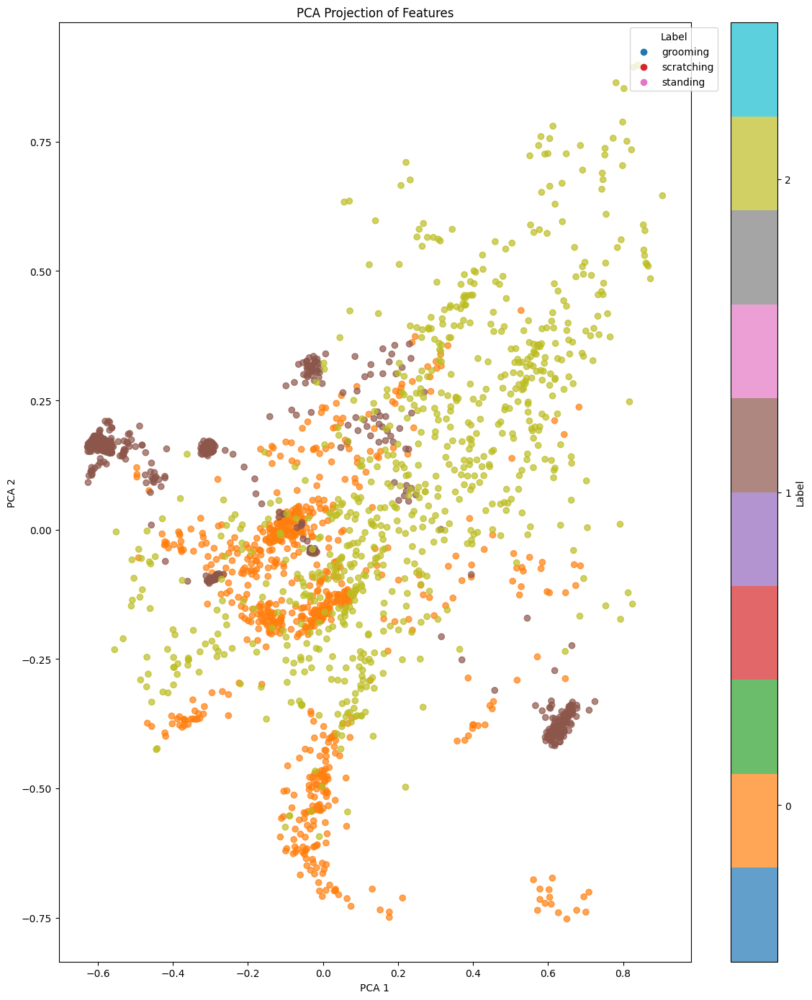

In [13]:
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA


labels = data["label"]

# Convert string labels to integers
le = LabelEncoder()
numeric_labels = le.fit_transform(labels) 

# PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)

# Scatter plot
plt.figure(figsize=(12, 14))
scatter = plt.scatter(
    pca_result[:,0],
    pca_result[:,1],
    c=numeric_labels,  
    cmap="tab10",
    alpha=0.7
)
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.title("PCA Projection of Features")

# Colorbar showing numeric labels
plt.colorbar(scatter, ticks=range(len(le.classes_)), label="Label")
plt.clim(-0.5, len(le.classes_)-0.5)

# Optional legend with original labels
for i, class_name in enumerate(le.classes_):
    plt.scatter([], [], color=plt.cm.tab10(i/len(le.classes_)), label=class_name)
plt.legend(title="Label", bbox_to_anchor=(1.05, 1), loc='upper right')

plt.tight_layout()
plt.savefig("./csv_plots/balanced_normalized_features_added_keypoints_activity/feature_PCA_projection_normalized_balanced_normalized_features_added_keypoints_activity.png")
plt.show()


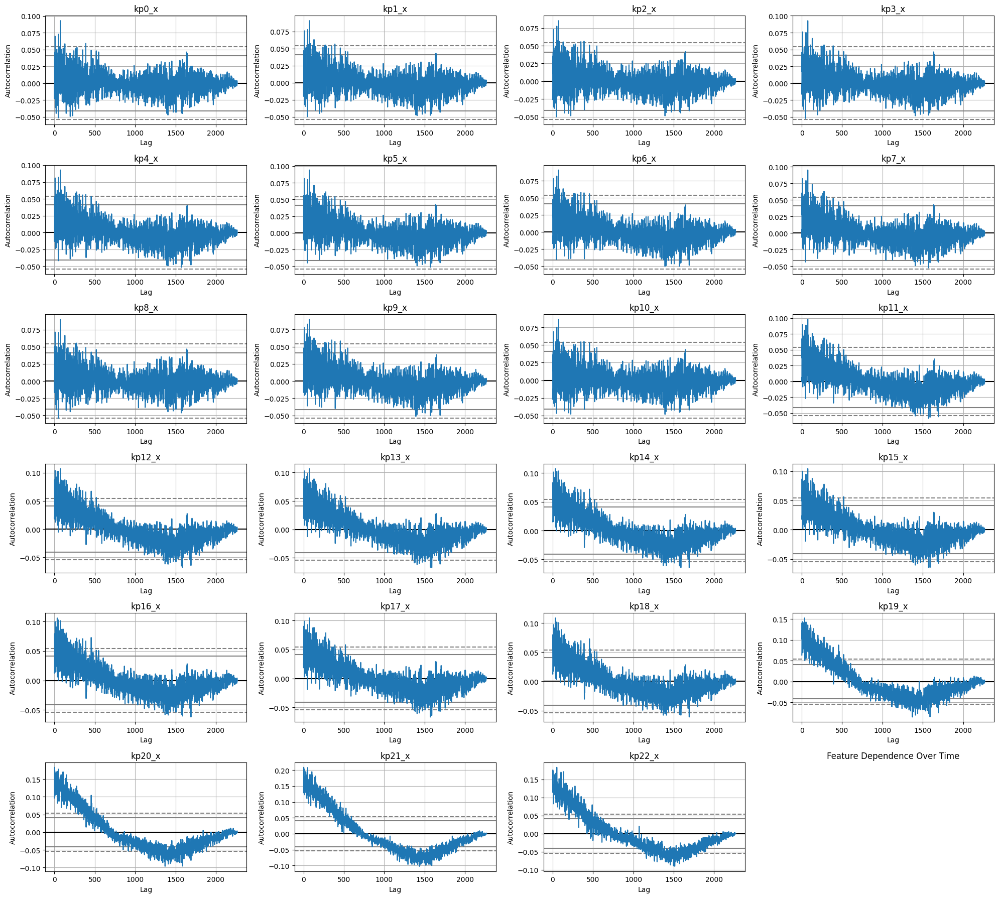

In [14]:
from pandas.plotting import autocorrelation_plot

num_features = 23
cols = 4  

# compute number of rows
rows = (num_features + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(20, rows*3))
axes = axes.flatten()  

for key_idx in range(num_features):
    autocorrelation_plot(data[f"kp{key_idx}_x"], ax=axes[key_idx])
    axes[key_idx].set_title(f"kp{key_idx}_x")

# Turn off empty subplots (if num_features < rows*cols)
for i in range(num_features, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.title("Feature Dependence Over Time")
plt.savefig("./csv_plots/balanced_normalized_features_added_keypoints_activity/feature_dependence_overtime_balanced_normalized_features_added_keypoints_activity.png")
plt.show()

In [15]:
from sklearn.tree import DecisionTreeClassifier

# Train Decision Tree
clf = DecisionTreeClassifier(max_depth=6, random_state=42)  # limit depth for readability
clf.fit(features, labels)

DecisionTreeClassifier(max_depth=6, random_state=42)

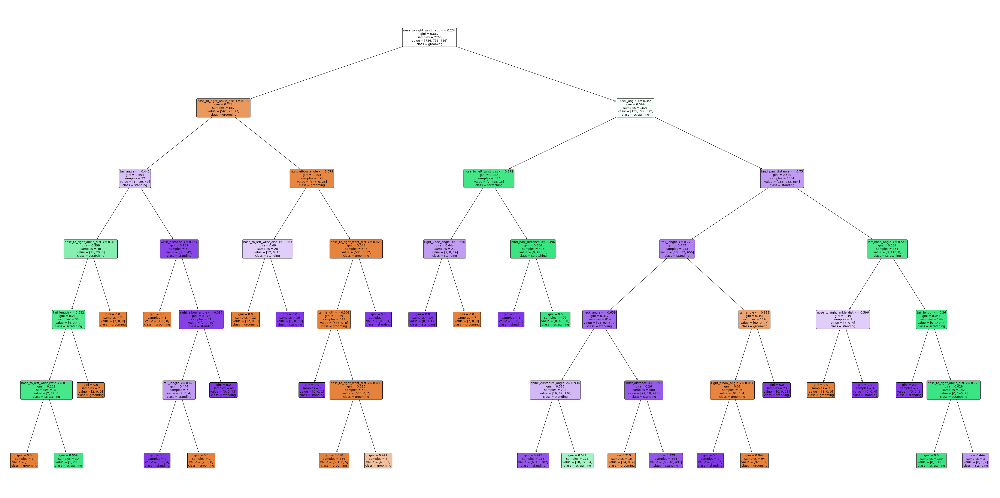

In [16]:
from sklearn import tree

plt.figure(figsize=(60,30))
tree.plot_tree(
    clf,
    feature_names=features.columns,
    class_names=clf.classes_,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.savefig("./csv_plots/balanced_normalized_features_added_keypoints_activity/decision_tree_balanced_normalized_features_added_keypoints_activity.png")
plt.show()